# Patchset Experiments

In [1]:
from pathlib import Path
from glob import glob
import netCDF4
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
from utils import CROP_ENCODING

## A function to produce monthly band data for the growing season

In [2]:
def monthly_band_data(band, year):

    # Or maybe aggregate based on a given frequency
    # Refer to
    # https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases
    group_freq = '1MS'
    
    # output intervals
    date_range = pd.date_range(start=f'{year}-01-01', end=f'{int(year) + 1}-01-01', freq=group_freq)

    band_data = band.groupby_bins(
        'time',
        bins=date_range,
        right=True,
        include_lowest=False,
        labels=date_range[:-1]
    ).mean(dim='time').interpolate_na(
        dim='time_bins', method='linear', fill_value='extrapolate'
    )[3:9]

    return band_data

## A function to compute the RGB image from band data

In [3]:
def rgb2d(B02, B03, B04, time=0):
    return np.dstack((
            np.array((B04.isel(time=time) / 16).astype(np.uint8)),
            np.array((B03.isel(time=time) / 16).astype(np.uint8)),
            np.array((B02.isel(time=time) / 16).astype(np.uint8))
    )).copy()

In [4]:
def patch_rgb(patch_data, time=0):
    return rgb2d(
            patch['B02']['band'],
            patch['B03']['band'],
            patch['B04']['band'],
            time=time)    

## A function to load NetCDF4 band data, labels, parcels, and display parameters from a patch file into a dict

In [5]:
def load_patch_file(patch_file):
    patch = netCDF4.Dataset(Path(patch_file), 'r')
    #print(f'patch file "{patch_file}" contains patch data from {patch.patch_name}')
    B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02
    B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03
    B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04
    B08 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08
    patch_data = {
        'B02':  {
            'title': 'B02 - Blue',
            'band': B02,
            'uint8': np.array((B02 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B02, patch.patch_year),
            'plotc': 'b'
            },
        'B03': {
            'title': 'B03 - Green',
            'band': B03,
            'uint8': np.array((B03 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B03, patch.patch_year),
            'plotc': 'g'
        },
        'B04':   {
            'title': 'B04 - Red',
            'band': B04,
            'uint8': np.array((B04 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B04, patch.patch_year),
            'plotc': 'r'
        },
        'B08':   {
            'title': 'B08 - NIR',
            'band': B08,
            'uint8': np.array((B08 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B08, patch.patch_year),
            'plotc': 'y'
        },
        'parcels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['parcels'])),
        'labels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels'])),
        'name': patch.patch_name,
        'file': patch_file,
        'year': patch.patch_year,
        'patch_country_code': patch.patch_country_code,
        'rgbt0': rgb2d(B02, B03, B04, time=0)
    }
    return patch, patch_data

files = sorted(glob('dataset/netcdf/*.nc'))
print(f'{len(files)} NetCDF4 files')
print(files[0:5])
%time patch, patch_data = load_patch_file(files[5])
patch

754 NetCDF4 files
['dataset/netcdf/2019_31TBF_patch_17_11.nc', 'dataset/netcdf/2019_31TBF_patch_17_12.nc', 'dataset/netcdf/2019_31TBF_patch_17_13.nc', 'dataset/netcdf/2019_31TBF_patch_18_11.nc', 'dataset/netcdf/2019_31TBF_patch_18_12.nc']
CPU times: user 10.4 s, sys: 925 ms, total: 11.4 s
Wall time: 11.7 s


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: S4A Patch Dataset
    authors: Papoutsis I., Sykas D., Zografakis D., Sdraka M.
    patch_full_name: 2019_31TBF_patch_18_13
    patch_year: 2019
    patch_name: patch_18_13
    patch_country_code: ES
    patch_tile: 31TBF
    creation_date: 27 Apr 2021
    references: Documentation available at .
    institution: National Observatory of Athens.
    version: 21.03
    _format: NETCDF4
    _nco_version: netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco)
    _xarray_version: 0.17.0
    dimensions(sizes): 
    variables(dimensions): 
    groups: B01, B02, B03, B04, B05, B06, B07, B08, B09, B10, B11, B12, B8A, labels, parcels

## Show all images available for one band in one patch in one patch file

27 4 7 21


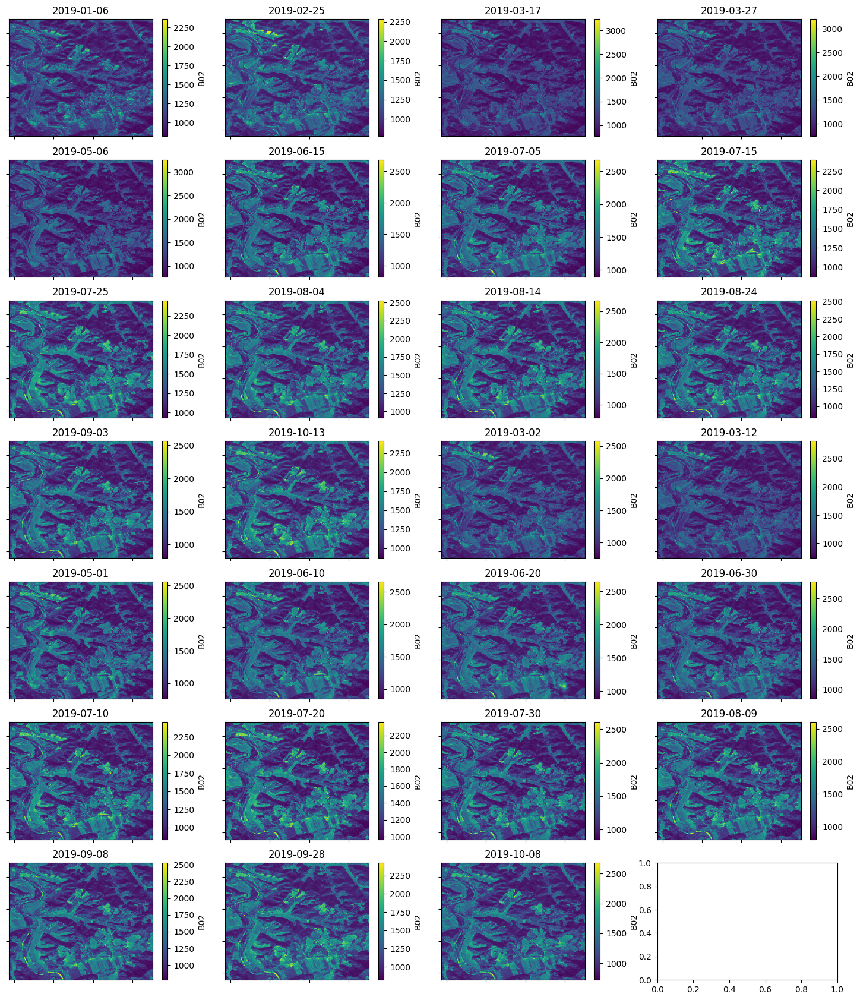

In [6]:
nimages = len(patch_data['B02']['band'].time)
ncols = 4
nrows = (nimages + ncols - 1) // ncols
height = nrows * 3
print(nimages, ncols, nrows, height)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, height))

for i, season in enumerate(patch_data['B02']['band']):
    if i >= nimages: break
    ax = axes.flat[i]
    cax = patch_data['B02']['band'].isel(time=i).plot(ax=ax)

for i, ax in enumerate(axes.flat):
    if i >= nimages: break
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    #ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'{patch_data["B02"]["band"].isel(time=i).time.dt.strftime("%Y-%m-%d").values}')

plt.show()

## Plot monthly data from one band for the growing season

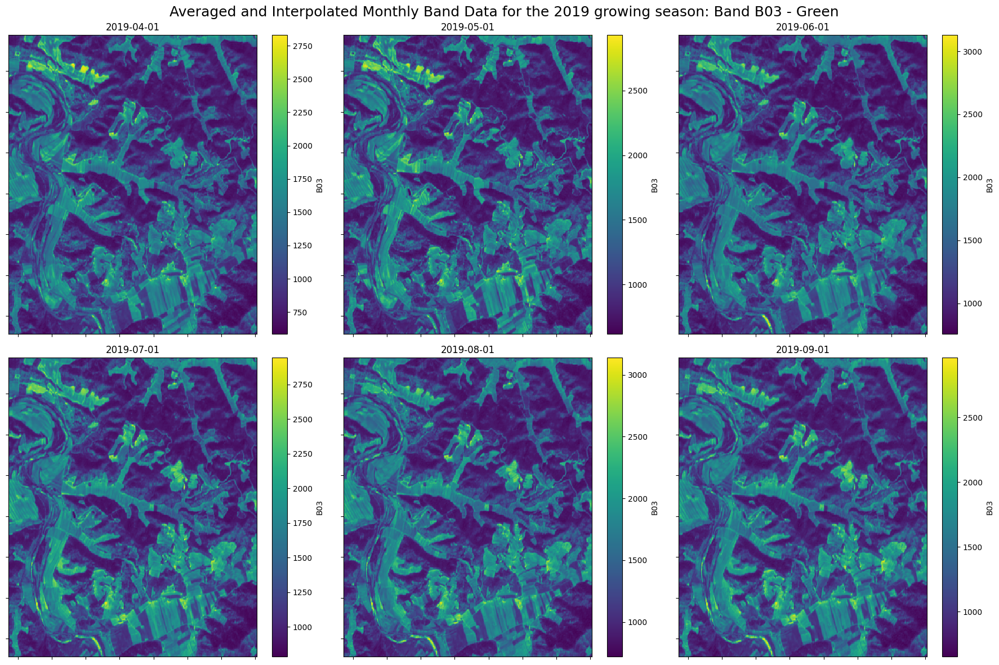

In [7]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
fig.suptitle(f'Averaged and Interpolated Monthly Band Data for the {patch_data["year"]} growing season: Band {patch_data["B03"]["title"]}', fontsize=18)
    
for i in range(len(patch_data['B03']['monthly'])):
    ax = axes.flat[i]
    cax = patch_data['B03']['monthly'].isel(time_bins=i).plot(ax=ax)

for i, ax in enumerate(axes.flat):
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'{patch_data["B03"]["monthly"].isel(time_bins=i).time_bins.dt.strftime("%Y-%m-%d").values}')

plt.tight_layout()
plt.show()

## Display band data, labels, and parcels

10 unique label indexes: [  0 110 150 330 353 361 442 911 975 998]
555 unique parcel ids: [      0 1097569 1097577 1097641 1097647 1097650 1097651 1097654 1097696
 1097700 1097702 1097720 1097738 1097739 1098183 1098188 1098197 1098218
 1098222 1098245 1098246 1098251 1098252 1098256 1098262 1098278 1098280
 1098286 1098287 1098295 1098302 1098303 1098305 1098307 1098311 1098314
 1098344 1098347 1098395 1098402 1098405 1098438 1098441 1098442 1098444
 1098450 1098455 1098456 1098462 1098471 1098474 1098513 1098522 1100408
 1100410 1100411 1100412 1100414 1100808 1100809 1100810 1100811 1100981
 1100985 1100986 1100992 1100994 1100995 1100999 1101000 1101001 1101003
 1101019 1101075 1101086 1101088 1101096 1101110 1101121 1101127 1101129
 1101785 1101789 1101795 1101801 1101802 1101805 1101811 1101816 1101819
 1101822 1101827 1101830 1101834 1101836 1101837 1101841 1101843 1101848
 1101854 1101866 1101867 1101871 1101875 1101879 1101881 1101894 1101902
 1101905 1101910 1101915 1101927 1

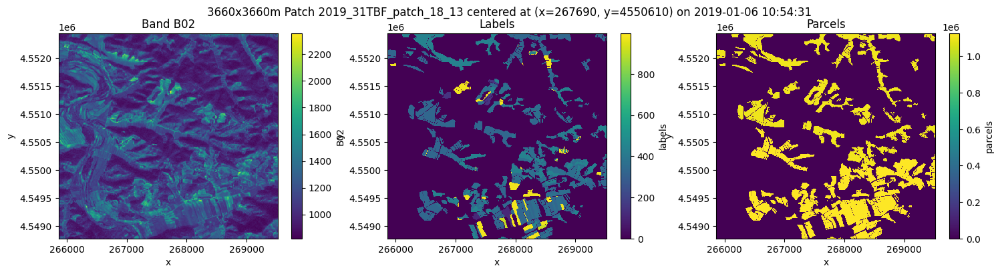

In [8]:
def show_patch(patch_data, time=0):

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 4))

    # Extract location information -- only available in the parcel group
    x = (np.array(patch_data['parcels'].coords['x'])[-1] + np.array(patch_data['parcels'].coords['x'])[0]) / 2
    y = (np.array(patch_data['parcels'].coords['y'])[-1] + np.array(patch_data['parcels'].coords['y'])[0]) / 2
    band_data = patch_data['B02']['band']

    # Extract time information
    ftime = band_data.isel(time=time).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
    fig.suptitle(f'3660x3660m Patch {patch.patch_full_name} centered at (x={x:.0f}, y={y:.0f}) on {ftime}')
    
    band_data.isel(time=time).plot(ax=ax[0])
    ax[0].set_title(f'Band B02')

    labels = np.unique(patch_data['labels'].to_dataarray())
    print(f'{len(labels)} unique label indexes:', labels)
    patch_data['labels'].labels.plot(ax=ax[1])
    ax[1].set_title('Labels')

    parcels = np.unique(patch_data['parcels'].parcels)
    print(f'{len(parcels)} unique parcel ids:', parcels)
    patch_data["parcels"].parcels.plot(ax=ax[2])
    ax[2].set_title(f'Parcels')

show_patch(patch_data)

### Define directions

Arbitrarily decide that the positive directions are east and south, due to the increasing directions in our dataset

_look for negative numbers as an indication of an error in calculations_

In [9]:
def west(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['x']))[0]

def east(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['x']))[-1]

def north(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['y']))[0]

def south(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['y']))[-1]

def rangex(patch_data):
    return east(patch_data) - west(patch_data)
    
def rangey(patch_data):
    return south(patch_data) - north(patch_data)

print('west:', west(patch_data))
print('east:', east(patch_data))
print('north:', north(patch_data))
print('south:', south(patch_data))

west: 265865.0
east: 269515.0
north: 4548785.0
south: 4552435.0


## Functions for Label Access and Conversion

In [49]:
def decode_labels(labels):
    CROP_DECODING = dict((v,k) for k, v in CROP_ENCODING.items())
    CROP_DECODING[0] = "UNDEFINED"
    return np.vectorize(CROP_DECODING.get)(labels)

def decode_label(label):
    return decode_labels(label)

def get_label_list(patch_data):
    label_array = np.array(patch_data['labels'].to_dataarray()[0])
    label_list = np.sort(np.unique(label_array))[1:]
    return label_list

def get_label_idx_from_id(patch_data, label_id=0):
    labels = get_label_list(patch_data)
    label_idx = np.where(np.sort(labels) == label_id)[0][0]
    return label_idx

def get_label_id_from_idx(patch_data, label_index=0):
    labels = get_label_list(patch_data)
    label_id = np.sort(labels)[label_index]
    return label_id

def get_label_name_from_idx(patch_data, label_index=0):
    label_id = get_label_id_from_idx(patch_data, label_index)
    label_name = decode_label(label_id)
    return label_name

def get_label_data(patch_data):
    label_data = np.array(patch_data['labels'].to_dataarray())[0]
    return label_data

def get_label_mask_from_id(patch_data, label=0):
    label_data = get_label_data(patch_data)
    label_mask = np.zeros(label_data.shape, dtype=np.uint16)
    label_mask[label_data == label] = 1
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    return label_mask

def get_label_mask_from_idx(patch_data, label_index=0):
    label_data = get_label_data(patch_data)
    label = get_label_id_from_idx(patch_data, label_index)
    label_mask = np.zeros(label_data.shape, dtype=np.uint16)
    label_mask[label_data == label] = 1
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    return label_mask

def count_label_mask_pixels(patch_data, label_idx):
    label_mask = get_label_mask_from_idx(patch_data, label_idx)
    unique, counts = np.unique(label_mask, return_counts=True)
    return counts[1]

unique_indexes = get_label_list(patch_data)
print('get_label_list:', unique_indexes)

fields = decode_labels(unique_indexes)
print('decode_labels (Crops):', fields)

label_mask = get_label_mask_from_idx(patch_data, 0)
type(label_mask), label_mask.shape

print(f'Patch has {count_label_mask_pixels(patch_data, 0)} pixels of index 0')
print(f'Patch has {count_label_mask_pixels(patch_data, 1)} pixels of index 1')

get_label_list: [330 353 354 361 380 442 510 623 790 975 981 998]
decode_labels (Crops): ['Grapes' 'Cherries and sour cherries' 'Peaches and nectarines' 'Almonds'
 'Other fruits' 'Olives' 'Potatoes' 'Other temporary spice crops n.e.c.'
 'Leguminous crops n.e.c.' 'Fallow land' 'Other crops temporary'
 'Unknown crops']
Patch has 12705 pixels of index 0
Patch has 183 pixels of index 1


## Function to format Ticks on Plot Axes

* Pixels have 10m resolution, so update ticks to show 10m per pixel

In [11]:
def plot_tick_format(tick_val, tick_pos):
    return int(tick_val * 10)

## Highlight Label Bounding Boxes

* Read a mask image (such as a crop label)
* Draw an outline around labeled pixels
* Allow width specification
* Clear the original label

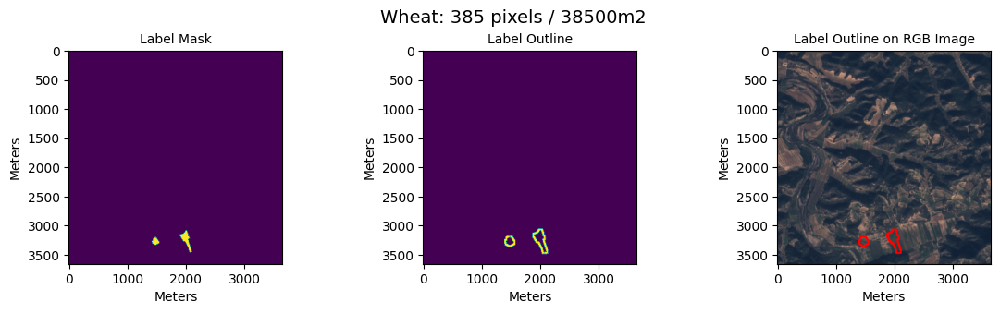

In [12]:
def draw_label_outline(image, color=1, width=3):
    #print('type(image):', type(image))
    outline_image = image.copy()
    
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    for w in range(width):
        indicies = np.where((outline_image > 0))
        ai = np.array(indicies) + 1
        for addsub in [-1, 1]:
            for idx in range(2):
                for n in range(2):
                    ai=np.clip(ai, 0, 365)
                    outline_image[tuple(ai)] = color
                    ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image

label_idx = 0
label = get_label_id_from_idx(patch_data, label_idx)
label_img = get_label_mask_from_idx(patch_data, label_idx)
outline = draw_label_outline(label_img)
rgb_outline = patch_data['rgbt0'].copy()
rgb_outline[outline != 0] = [0xFF,0,0]
num_pix = count_label_mask_pixels(patch_data, label_idx)
m2 = num_pix * 100

fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
fig.suptitle(f'{decode_label(label)}: {num_pix} pixels / {m2}m2', y=1.03, fontsize=14)
ax[0].imshow(label_img)
ax[0].set_title(f'Label Mask', fontsize=10)
ax[0].xaxis.set_major_formatter(plot_tick_format)
ax[0].yaxis.set_major_formatter(plot_tick_format)
ax[0].set_xlabel('Meters')
ax[0].set_ylabel('Meters')
#ax[0].set_xticklabels([0, 1880, 3660])
ax[1].imshow(outline)
ax[1].set_title(f'Label Outline', fontsize=10)
ax[2].imshow(rgb_outline)
ax[2].set_title(f'Label Outline on RGB Image', fontsize=10)

for n in range(3):
    ax[n].xaxis.set_major_formatter(plot_tick_format)
    ax[n].yaxis.set_major_formatter(plot_tick_format)
    ax[n].set_xlabel('Meters')
    ax[n].set_ylabel('Meters')    

## Zoom to the masked RGB Crop data

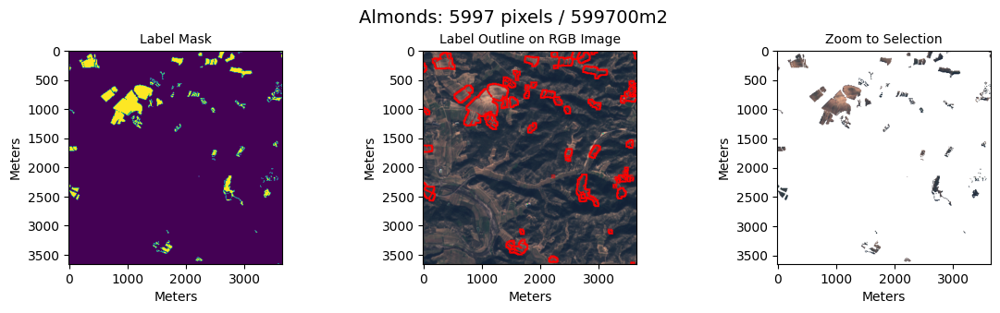

In [50]:
def auto_zoom(image):
    '''
    Zoom to the smallest image containing all non-white pixels

    If any non-white pixels exists on all 4 outer 
    '''
    indicies = np.array(np.where(np.all(image != (0xFF, 0xFF, 0xFF), axis=-1)))
    assert indicies.shape[1] > 0, "No non-white pixels were found in RGB image"
    top = np.min(indicies[0])
    bottom = np.min([365, np.max(indicies[0]) + 1])
    left = np.min(indicies[1])
    right = np.min([365, np.max(indicies[1]) + 1])
    return image[top:bottom, left:right, :]

def get_rgb_selection(patch_data, label_index=0):
    label_mask = get_label_mask_from_idx(patch_data, label_index)
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    return rgb3_selection

# Note: this is obsolete, but may be used again later
def zoom_to_label(patch_data, label_index=0):
    rgb3_selection = get_rgb_selection(patch_data, label_index)
    return auto_zoom(rgb3_selection)

label_idx = 3
label = get_label_id_from_idx(patch_data, label_idx)
label_mask = get_label_mask_from_idx(patch_data, label_idx)

outline = draw_label_outline(label_mask)
rgb_outline = patch_data['rgbt0'].copy()
rgb_outline[outline != 0] = [0xFF,0,0]
rgb3_selection = get_rgb_selection(patch_data, label_idx)
rgb_crop_zoom = auto_zoom(rgb3_selection)

num_pix = count_label_mask_pixels(patch_data, label_idx)
m2 = num_pix * 100

fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
fig.suptitle(f'{decode_labels([label])[0]}: {num_pix} pixels / {m2}m2', y=1.03, fontsize=14)
ax[0].imshow(label_mask)
ax[0].set_title(f'Label Mask', fontsize=10)
ax[0].xaxis.set_major_formatter(plot_tick_format)
ax[0].yaxis.set_major_formatter(plot_tick_format)
ax[0].set_xlabel('Meters')
ax[0].set_ylabel('Meters')
ax[1].imshow(rgb_outline)
ax[1].set_title(f'Label Outline on RGB Image', fontsize=10)
ax[2].imshow(rgb_crop_zoom)
ax[2].set_title(f'Zoom to Selection', fontsize=10)

for n in range(3):
    ax[n].xaxis.set_major_formatter(plot_tick_format)
    ax[n].yaxis.set_major_formatter(plot_tick_format)
    ax[n].set_xlabel('Meters')
    ax[n].set_ylabel('Meters')    

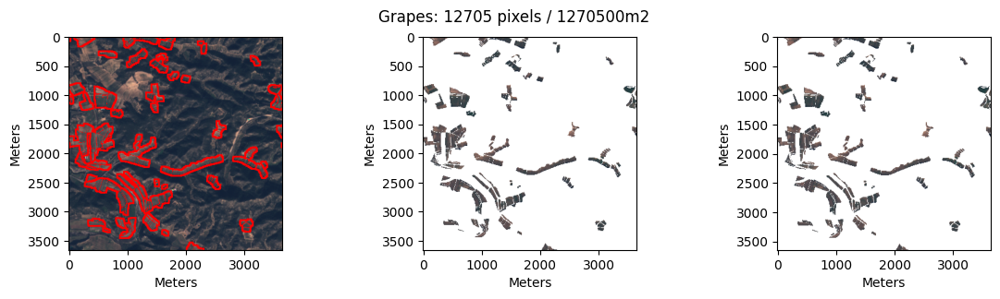

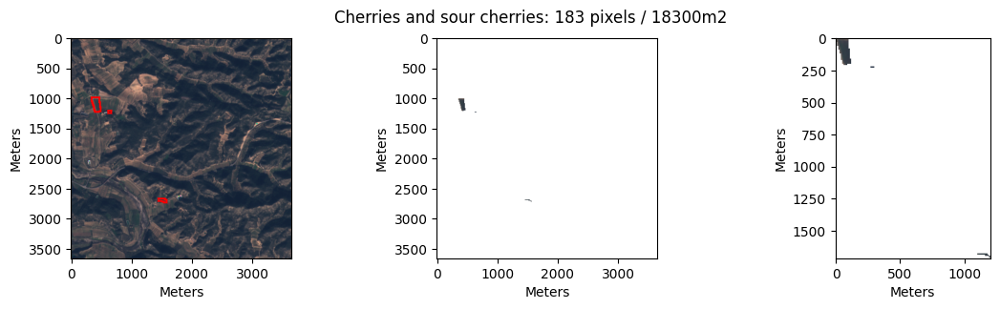

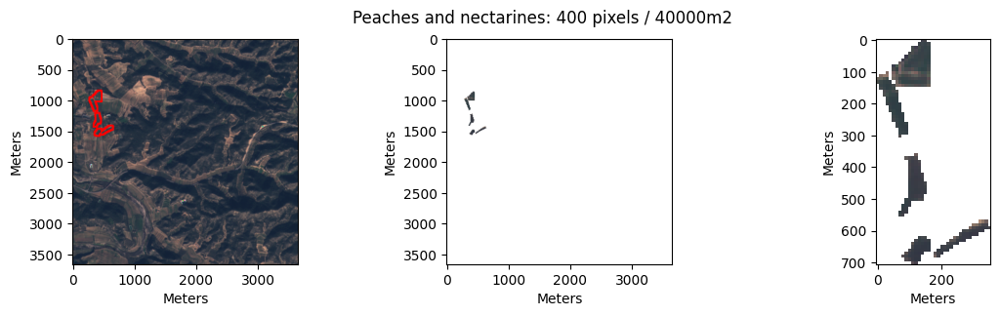

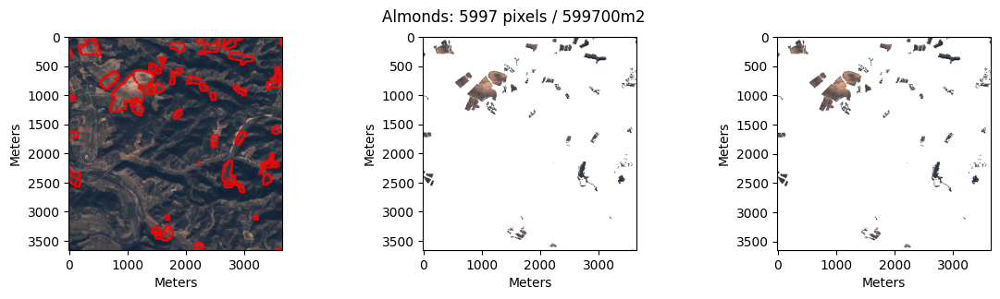

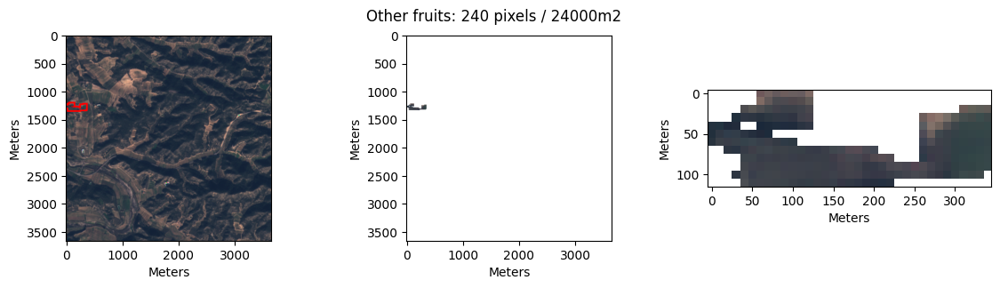

...

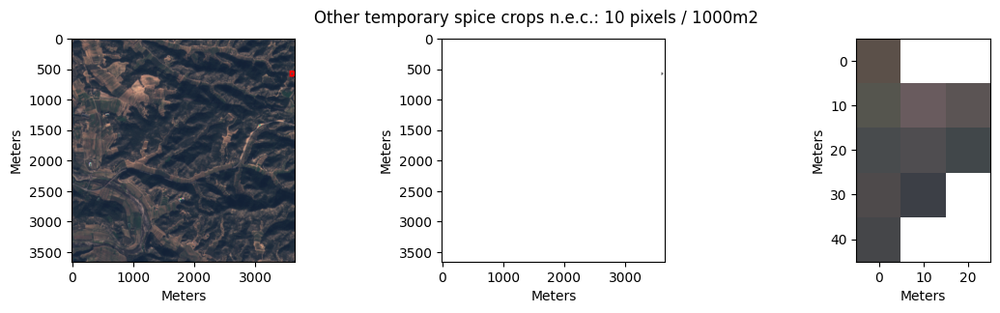

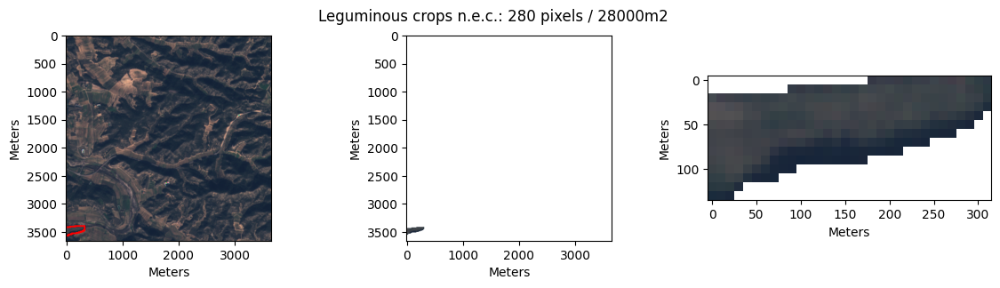

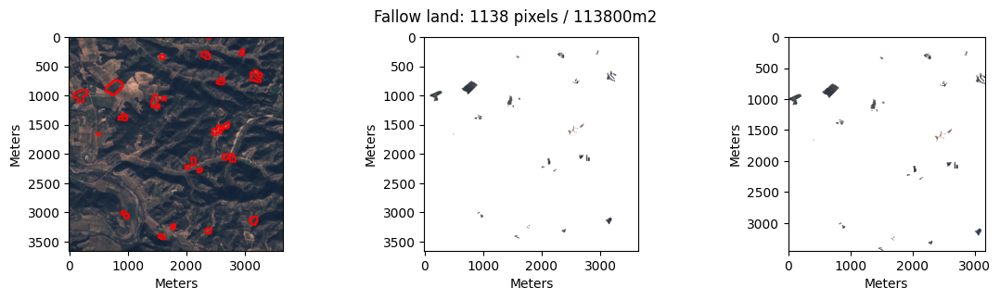

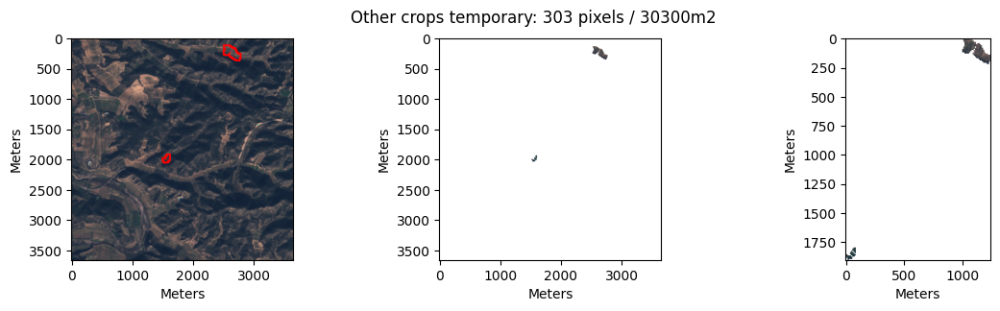

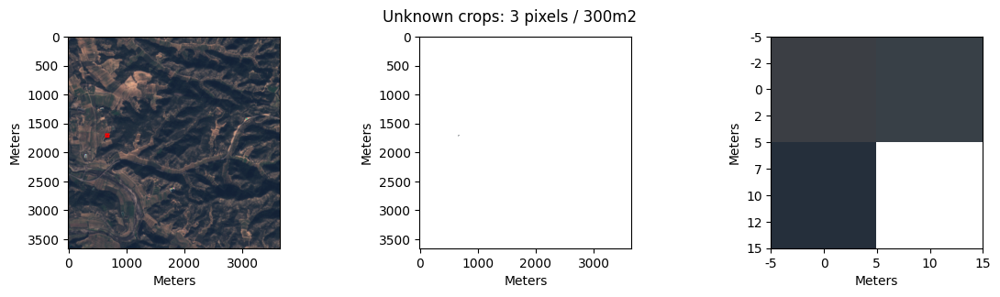

In [51]:
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    label_mask = get_label_mask_from_id(patch_data, label)
    outline = draw_label_outline(label_mask)
    rgb3_outline = patch_data['rgbt0'].copy()
    rgb3_outline[outline != 0] = [0xFF,0,0]

    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    rgb3_crop_zoom = auto_zoom(rgb3_selection)

    num_pix = count_label_mask_pixels(patch_data, n)
    m2 = num_pix * 100
    
    fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
    fig.suptitle(f'{decode_labels([label])[0]}: {num_pix} pixels / {m2}m2')
    ax[0].imshow(rgb3_outline)
    ax[1].imshow(rgb3_selection)
    ax[2].imshow(rgb3_crop_zoom)

    for n in range(3):
        ax[n].xaxis.set_major_formatter(plot_tick_format)
        ax[n].yaxis.set_major_formatter(plot_tick_format)
        ax[n].set_xlabel('Meters')
        ax[n].set_ylabel('Meters')
        #ax[n].set_ylim([0, :])    

## A function to draw all 4 band histograms of an entire patch

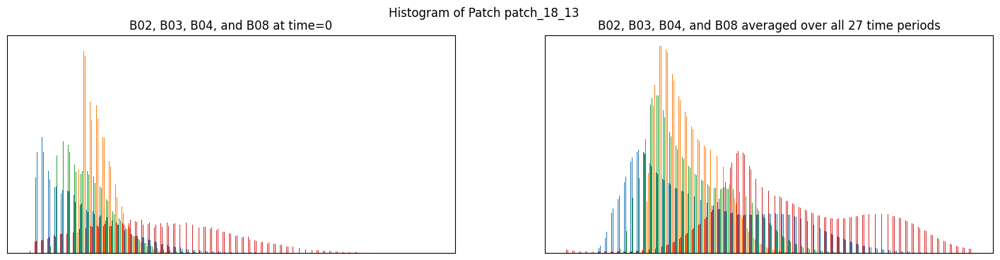

In [15]:
def draw_patch_histogram(patch_data):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))
    fig.suptitle(f'Histogram of Patch {patch_data["name"]}')
    ax0 = axes[0].hist([
            np.array(patch_data['B04']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B02']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B03']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B08']['band'].isel(time=0)).flatten()
    ], bins=256)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    _ = axes[0].set_title(f'B02, B03, B04, and B08 at time=0')
    ax1 = axes[1].hist([
            patch_data['B04']['uint8'].flatten(),
            patch_data['B02']['uint8'].flatten(),
            patch_data['B03']['uint8'].flatten(),
            patch_data['B08']['uint8'].flatten()
    ], bins=256)
    _ = axes[1].set_title(f'B02, B03, B04, and B08 averaged over all {patch_data["B04"]["uint8"].shape[0]} time periods')
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    plt.show()

draw_patch_histogram(patch_data)

## Draw the set of band histograms for a specific label

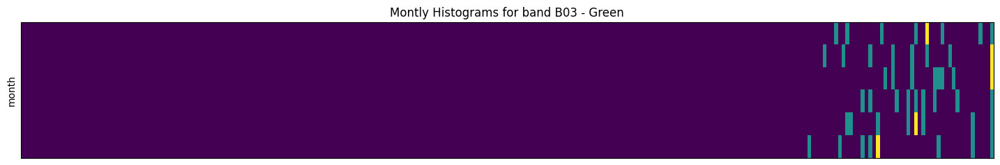

In [16]:
def plot_masked_hist_2(ax, band, mask, pixel_height=6):
    max = np.max(band)
    cmap = plt.colormaps['jet']
    nbins = 256
    __band = band.copy()
    hist = np.zeros((band.shape[0]*pixel_height, nbins))
    for n in range(band.shape[0]):
        __band_data = np.array(__band[n,:,:])
        __band_data[mask == 0] = 0
        hist[n*pixel_height:n*pixel_height+pixel_height], _ = np.histogram(__band_data, bins=nbins)
        hist[n*pixel_height:n*pixel_height+pixel_height,0] = 0
    #print(f'hist_max: {np.max(hist)}, shape: {hist.shape}, dtype: {hist.dtype}')
    _ = ax.imshow(hist)
    _ = ax.set_xticks([])

fig, ax = plt.subplots(figsize=(18, 4))
#fig.suptitle(f'Histogram of Patch {patch_data["name"]}')

_ = plot_masked_hist_2(ax, patch_data['B03']['monthly'], label_mask)
_ = ax.set_title(f'Montly Histograms for band {patch_data["B03"]["title"]}')
_ = ax.set_ylabel('month')
_ = ax.set_yticks([])

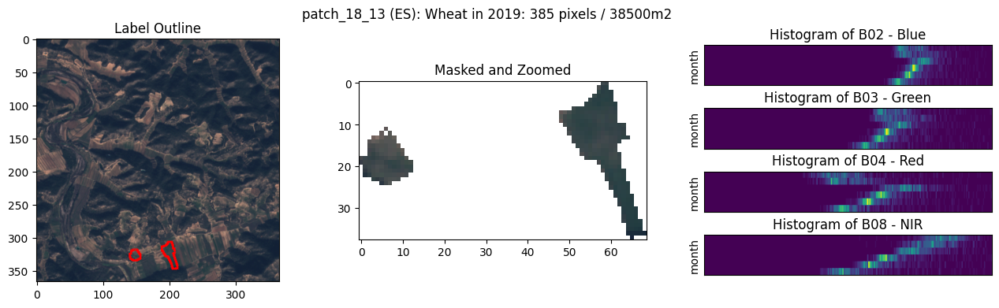

In [17]:
def plot_crop(patch_data, label_idx=0):
    name = get_label_name_from_idx(patch_data, label_idx)
    #print(f'Plotting "{name}" from {patch_data["name"]}')
    label_img = get_label_mask_from_idx(patch_data, label_idx)
    outline = draw_label_outline(label_img)
    rgb3_outline = patch_data['rgbt0'].copy()
    rgb3_outline[outline != 0] = [0xFF,0,0]
    
    label_mask = get_label_mask_from_idx(patch_data, label_idx)
    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    
    rgb3_crop_zoom = auto_zoom(rgb3_selection)

    num_pix = count_label_mask_pixels(patch_data, label_idx)
    m2 = num_pix * 100
    
    fig = plt.figure(figsize=(16, 4))
    fig.suptitle(f'{patch_data["name"]} ({patch_data["patch_country_code"]}): {name} in {patch_data["year"]}: {num_pix} pixels / {m2}m2')
    gs = gridspec.GridSpec(4,3)
    
    ax0 = fig.add_subplot(gs[:,0])
    ax0.imshow(rgb3_outline)
    ax0.set_title('Label Outline')
    
    ax1 = fig.add_subplot(gs[:,1])
    ax1.imshow(rgb3_crop_zoom)
    ax1.set_title('Masked and Zoomed')
    
    ax20 = fig.add_subplot(gs[0,2])
    _ = plot_masked_hist_2(ax20, patch_data['B02']['monthly'], label_mask)
    _ = ax20.set_title(f'Histogram of {patch_data["B02"]["title"]}')
    _ = ax20.set_ylabel('month')
    _ = ax20.set_yticks([])
    
    ax21 = fig.add_subplot(gs[1,2])
    _ = plot_masked_hist_2(ax21, patch_data['B03']['monthly'], label_mask)
    _ = ax21.set_title(f'Histogram of {patch_data["B03"]["title"]}')
    _ = ax21.set_ylabel('month')
    _ = ax21.set_yticks([])
    
    ax22 = fig.add_subplot(gs[2,2])
    _ = plot_masked_hist_2(ax22, patch_data['B04']['monthly'], label_mask)
    _ = ax22.set_title(f'Histogram of {patch_data["B04"]["title"]}')
    _ = ax22.set_ylabel('month')
    _ = ax22.set_yticks([])
    
    ax23 = fig.add_subplot(gs[3,2])
    _ = plot_masked_hist_2(ax23, patch_data['B08']['monthly'], label_mask)
    _ = ax23.set_title(f'Histogram of {patch_data["B08"]["title"]}')
    _ = ax23.set_ylabel('month')
    _ = ax23.set_yticks([])

    #print(type(fig))
    #for n in range(3):
    #    ax[n].xaxis.set_major_formatter(plot_tick_format)
    #    ax[n].yaxis.set_major_formatter(plot_tick_format)
    #    ax[n].set_xlabel('Meters')
    #    ax[n].set_ylabel('Meters')
    #    #ax[n].set_ylim([0, :])    

plot_crop(patch_data, 0)

## Plot all crops in a patch

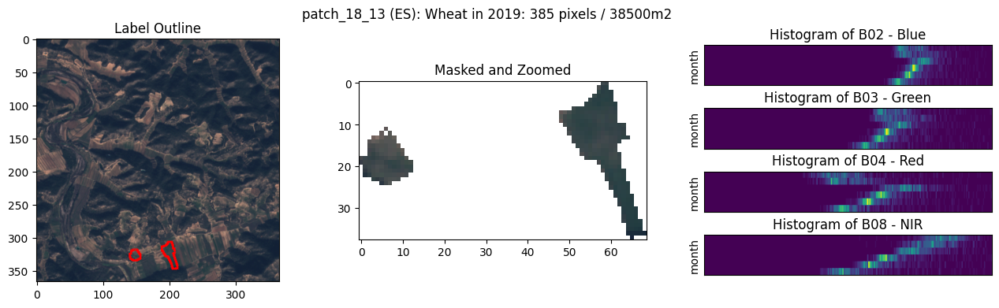

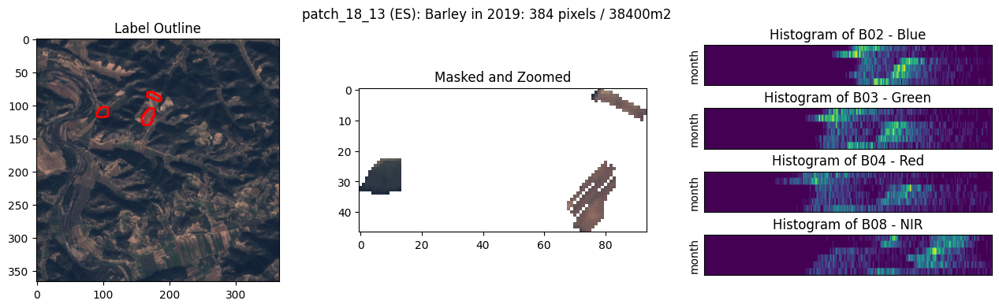

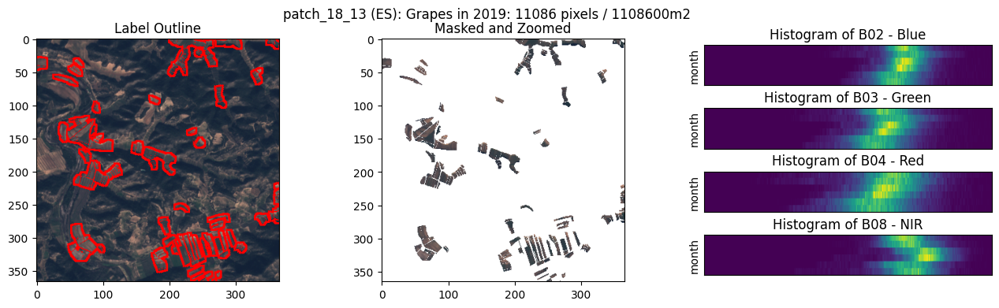

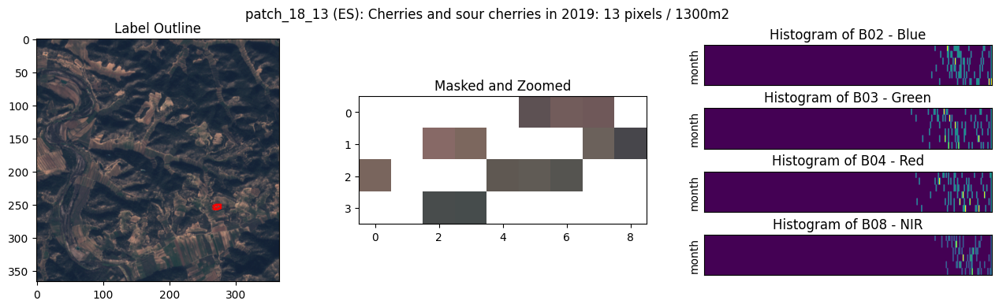

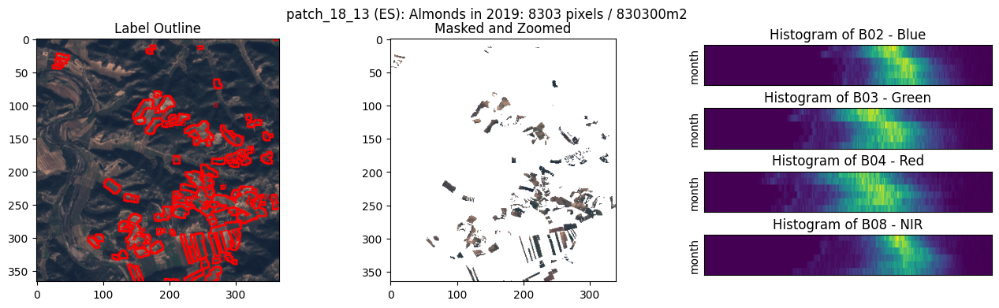

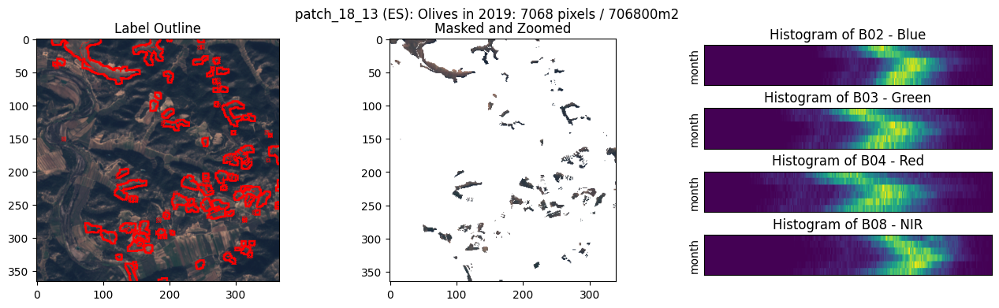

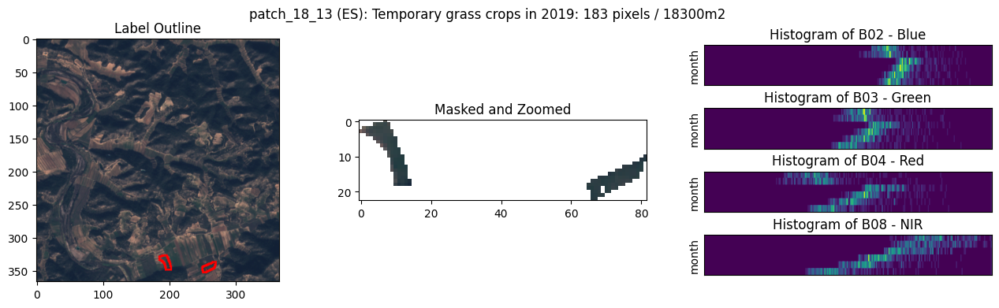

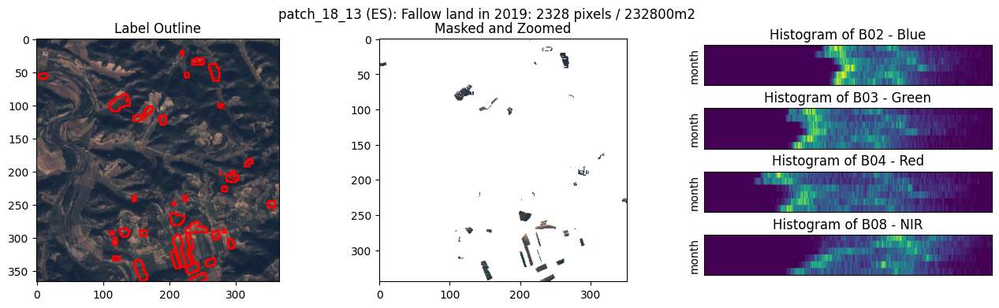

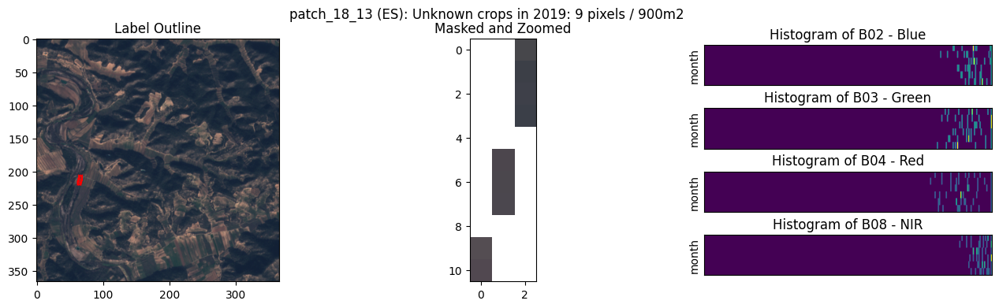

In [18]:
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    #print(f'Plotting patch data for label {n}: {label}')
    plot_crop(patch_data, n)

## Plot all crops in a patch file

754 NetCDF4 files
['dataset/netcdf/2019_31TBF_patch_17_11.nc', 'dataset/netcdf/2019_31TBF_patch_17_12.nc', 'dataset/netcdf/2019_31TBF_patch_17_13.nc', 'dataset/netcdf/2019_31TBF_patch_18_11.nc', 'dataset/netcdf/2019_31TBF_patch_18_12.nc']
CPU times: user 9.96 s, sys: 93.3 ms, total: 10 s
Wall time: 10.2 s


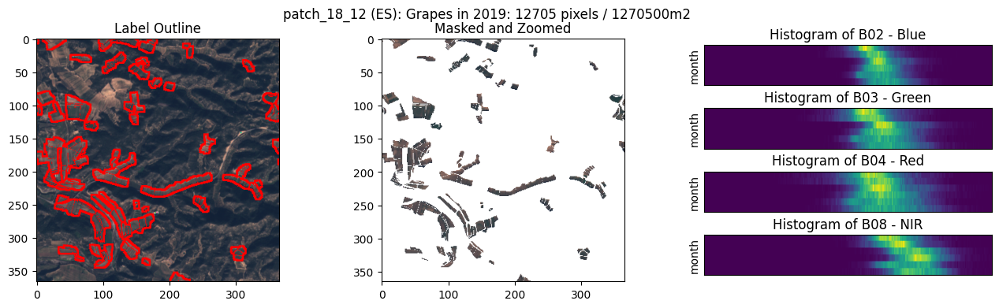

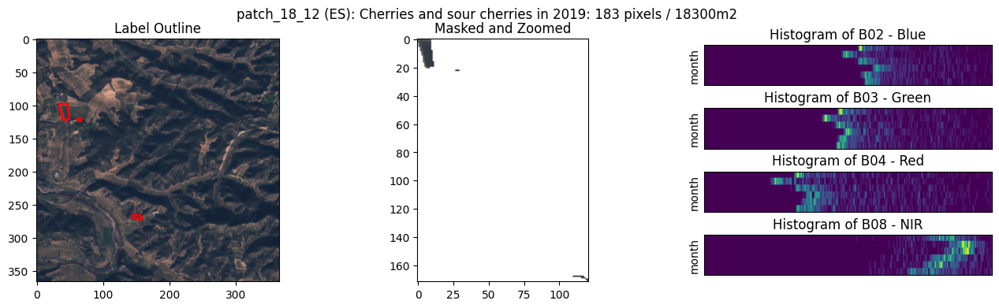

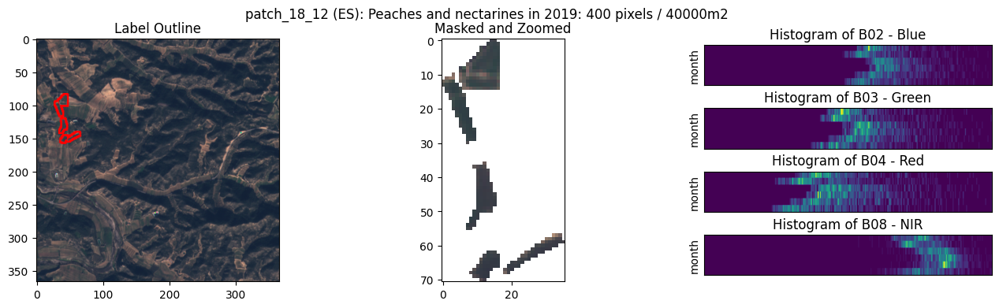

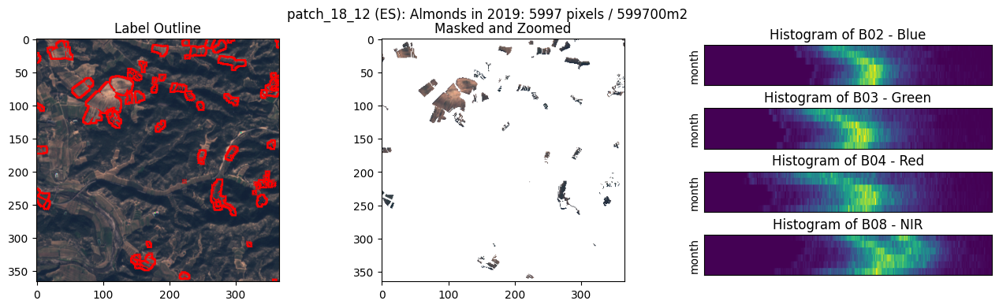

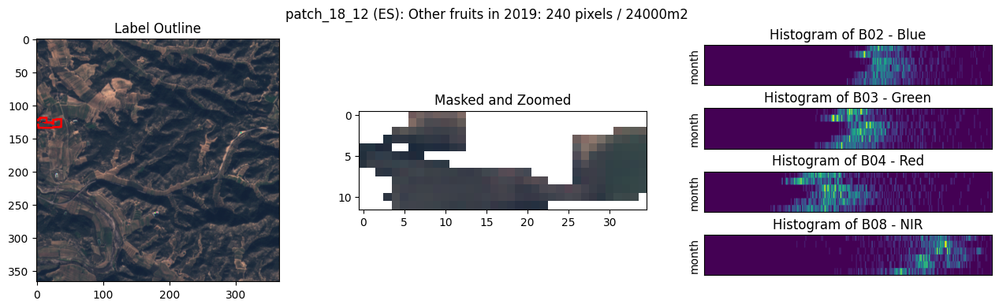

...

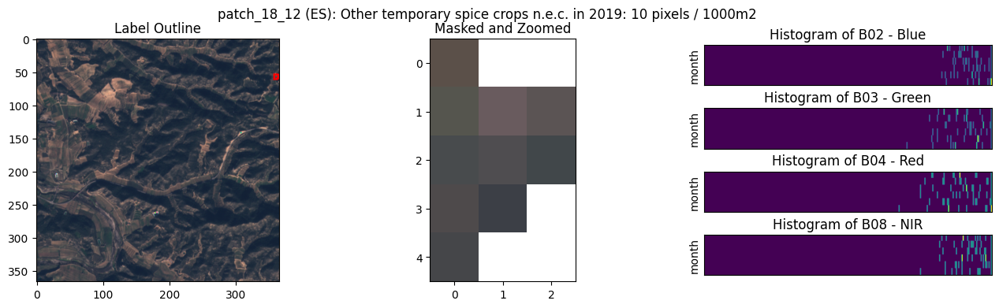

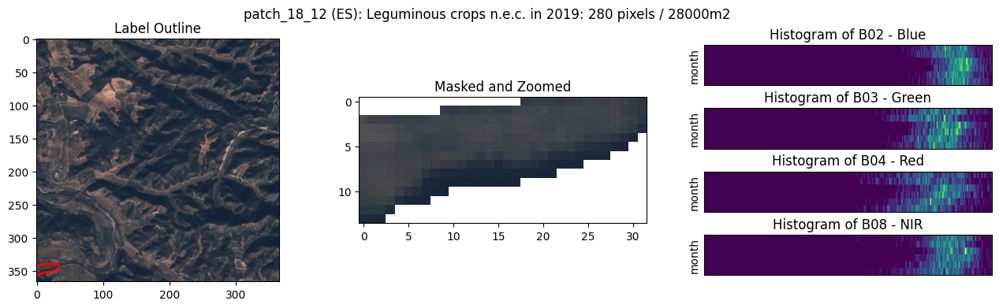

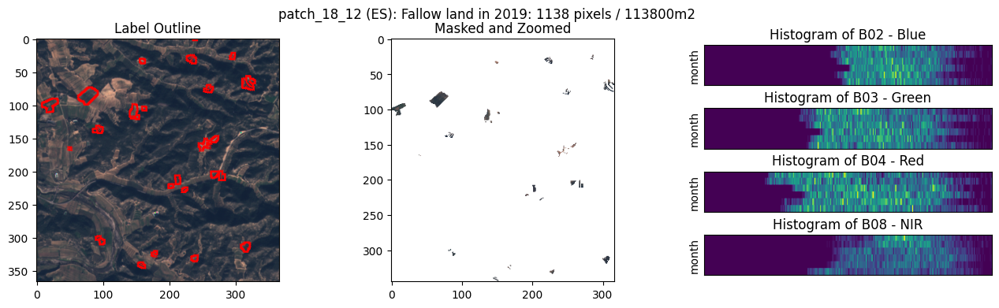

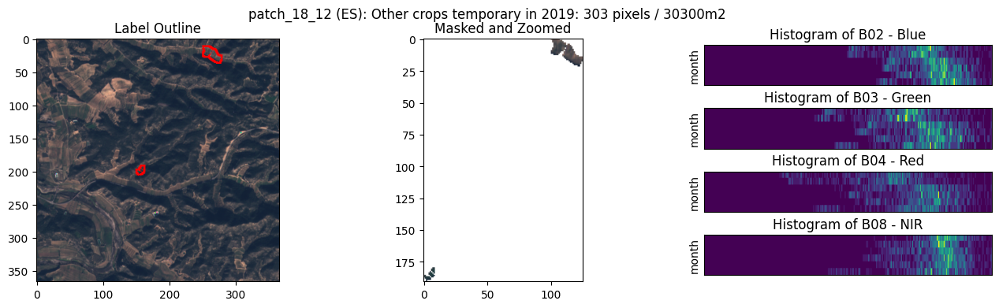

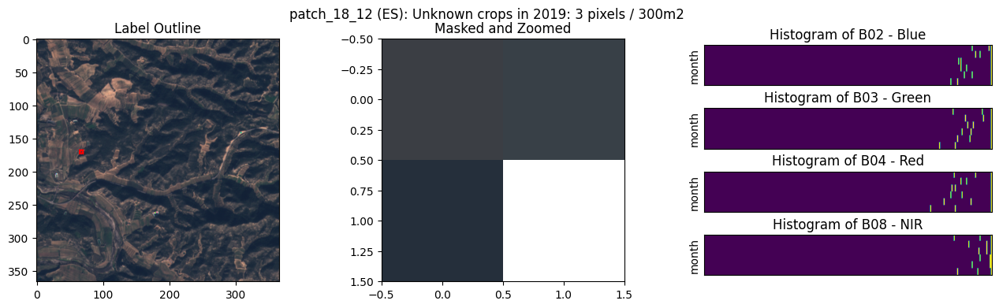

In [19]:
print(f'{len(files)} NetCDF4 files')
print(files[0:5])
%time patch, patch_data = load_patch_file(files[4])
#patch
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    plot_crop(patch_data, n)

## Find the same crop in 2 different patches

In [20]:
#print(files[0:5])
unique_labels = []
for n in range(2):
    print(f'load file {n}: {files[n]}')
    patch = netCDF4.Dataset(Path(files[n]), 'r')
    labels = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels']))
    unique_labels.append(np.unique(labels.to_dataarray())[1:])
    print(f'unique_labels:', unique_labels[-1])

label_intersections = unique_labels[0][np.in1d(unique_labels[0], unique_labels[1])]
label_intersections

load file 0: dataset/netcdf/2019_31TBF_patch_17_11.nc
unique_labels: [330 361 442 975]
load file 1: dataset/netcdf/2019_31TBF_patch_17_12.nc
unique_labels: [330 353 361 366 442 510 790 975]


array([330, 361, 442, 975], dtype=uint32)

patch_file: dataset/netcdf/2019_31TBF_patch_17_11.nc
patch_data from patch_17_11
patch_file: dataset/netcdf/2019_31TBF_patch_17_12.nc
patch_data from patch_17_12


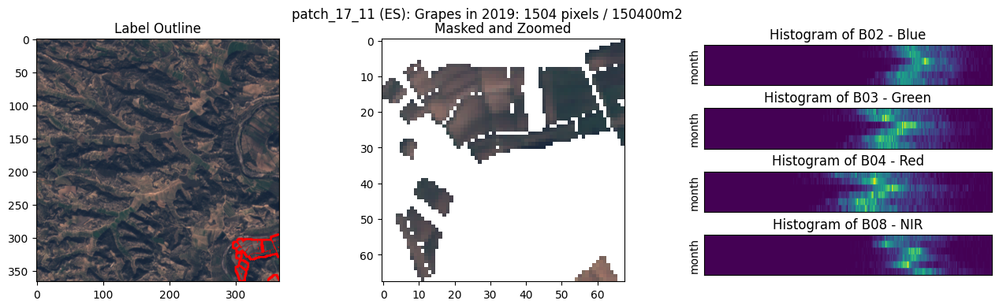

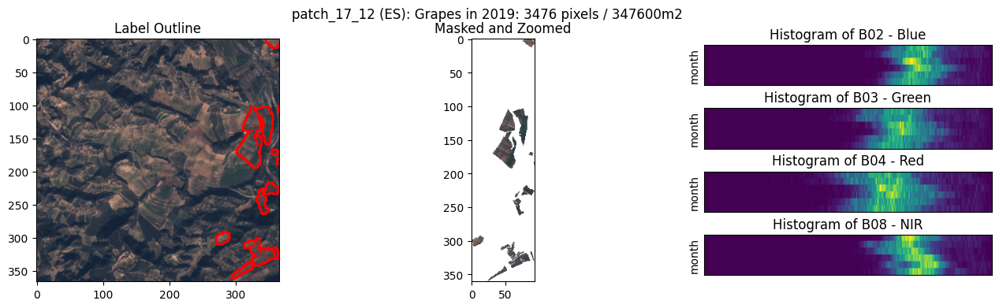

In [21]:
def plot_crop_from_patch_file(patch_file, crop_label):
    print('patch_file:', patch_file)
    patch, patch_data = load_patch_file(patch_file)
    print(f'patch_data from {patch_data["name"]}')
    crop_idx = get_label_idx_from_id(patch_data, crop_label)
    plot_crop(patch_data, crop_idx)

plot_crop_from_patch_file(files[0], 330)
plot_crop_from_patch_file(files[1], 330)

patch_file: dataset/netcdf/2019_31TBF_patch_17_11.nc
patch_data from patch_17_11
patch_file: dataset/netcdf/2019_31TBF_patch_17_12.nc
patch_data from patch_17_12


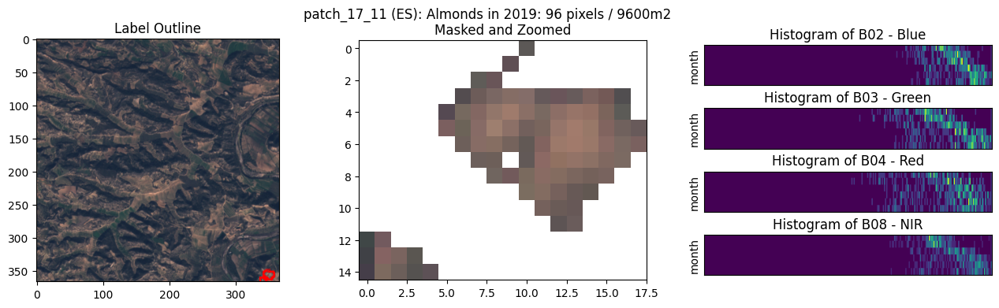

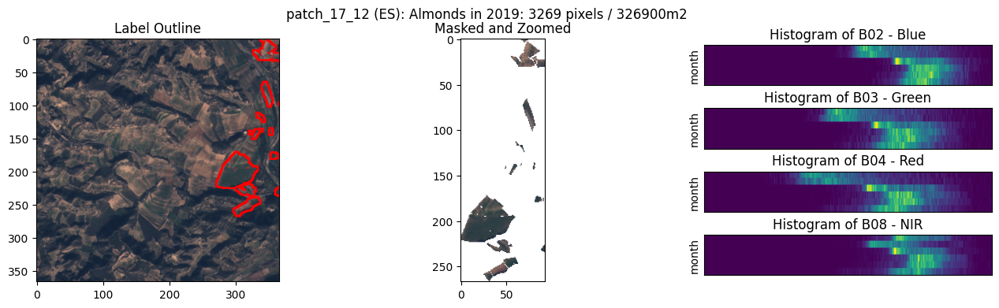

In [22]:
def plot_crop_from_patch_file(patch_file, crop_label):
    print('patch_file:', patch_file)
    patch, patch_data = load_patch_file(patch_file)
    print(f'patch_data from {patch_data["name"]}')
    crop_idx = get_label_idx_from_id(patch_data, crop_label)
    plot_crop(patch_data, crop_idx)

plot_crop_from_patch_file(files[0], 361)
plot_crop_from_patch_file(files[1], 361)

## Combine the same crop data from 2 different patchsets

In [23]:
patch1, patch_data1 = load_patch_file(files[0])
patch2, patch_data2 = load_patch_file(files[1])

plot_masked_band_hist: shape=(6, 366, 366), type=float64, band_max: 4668.75


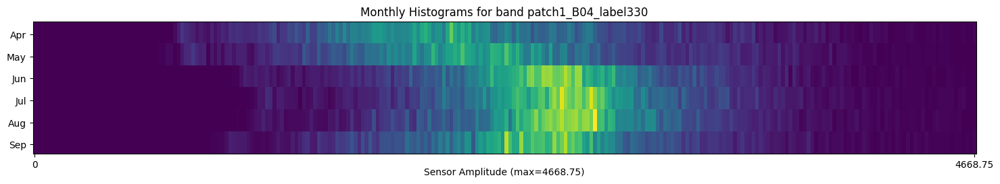

In [24]:
def plot_tick_format_hist(tick_val, tick_pos):
    print('plot_tick_format_hist')
    return int(tick_val * 10)

def plot_masked_band_hist(ax, masked_band, pixel_height=6, ylabels='all'):
    xmin = 0
    xmax = np.max(masked_band)
    print(f'plot_masked_band_hist: shape={masked_band.shape}, type={masked_band.dtype}, band_max: {xmax}')
    cmap = plt.colormaps['jet']
    
    nbins = 256
    hist = np.zeros((masked_band.shape[0]*pixel_height, nbins))
    for n in range(masked_band.shape[0]):
        __band_data = np.array(masked_band[n,:,:])
        hist[n*pixel_height:n*pixel_height+pixel_height], _ = np.histogram(__band_data, bins=nbins)
        hist[n*pixel_height:n*pixel_height+pixel_height,0] = 0
    #print('hist_height:', n*pixel_height+pixel_height)
    ymin = pixel_height / 2
    ymax = n * pixel_height + pixel_height - pixel_height / 2
    _ = ax.imshow(hist)
    if ylabels == 'firstlast':
        _ = ax.yaxis.set_major_locator(ticker.FixedLocator([ymin, ymax]))
        _ = ax.set_yticklabels(['Apr', 'Sept'])
        _ = ax.set_xlabel('Sensor Amplitude (8-bit)', labelpad=-10)
    if ylabels == 'all':
        _ = ax.yaxis.set_major_locator(ticker.FixedLocator(np.arange(patch1_B04_label330.shape[0]) * pixel_height + pixel_height / 2))
        _ = ax.set_yticklabels(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'])

    else:
        _ = ax.set_yticks([])
        #_ = ax.set_ylabel('Sensor Amplitude (8-bit)')

    _ = ax.set_xlabel(f'Sensor Amplitude (max={xmax})', labelpad=-2)
    _ = ax.xaxis.set_major_locator(ticker.FixedLocator([0, nbins-1]))
    _ = ax.set_xticklabels(['0', xmax])

fig, ax = plt.subplots(figsize=(18, 4))

patch1_B04_label330 = np.array(patch_data['B04']['monthly'].copy())
label_mask = get_label_mask_from_idx(patch_data, label_idx)
patch1_B04_label330[:,label_mask == 0] = 0

_ = plot_masked_band_hist(ax, patch1_B04_label330)
_ = ax.set_title(f'Monthly Histograms for band patch1_B04_label330')

### A convenience function to get all monthly pixel intensity data from a specific band of a specific crop

This requires the entire patch object instead of only the name, as would be done in a multi-patch interface

In [25]:
def get_masked_band_from_label(patch_data, band_name, label):
    label_idx = get_label_idx_from_id(patch_data, label)
    masked_band = np.array(patch_data[band_name]['monthly'].copy(), dtype=np.int32)
    label_mask = get_label_mask_from_idx(patch_data, label_idx)
    masked_band[:,label_mask == 0] = 0
    return masked_band

label1 = 330
label_idx1 = get_label_idx_from_id(patch_data1, label1)
name1 = get_label_name_from_idx(patch_data1, label_idx1)
df = pd.DataFrame({'band': ['B02', 'B03', 'B04', 'B08']})
df['label'] = label1
df['label_index'] = label_idx1
df['name'] = name1
df['masked_band'] = df.apply(lambda row: get_masked_band_from_label(patch_data1, row.band, row.label), axis=1)
df

,band,label,label_index,name,masked_band
0,B02,330,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
1,B03,330,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
2,B04,330,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
3,B08,330,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."


### Try 2 different methods of counting pixels matching a value

In [26]:
def count_label_mask_pixels1(patch_data, label_idx):
    label_mask = get_label_mask_from_idx(patch_data1, label_idx)
    num_mask_pixel = label_mask[label_mask != 0].size
    return num_mask_pixel

def count_label_mask_pixels2(patch_data, label_idx):
    label_mask = get_label_mask_from_idx(patch_data1, label_idx)
    unique, counts = np.unique(label_mask, return_counts=True)
    return counts[1]

print(count_label_mask_pixels(patch_data1, 1))
print(count_label_mask_pixels1(patch_data1, 1))
print(count_label_mask_pixels2(patch_data1, 1))

96
96
96


## Assemble a Pandas dataframe with relevant crop data

This should eventually be done using the NetCDF4 patch, rather the the already-imported and converted one, which is in the current version of this notebook as of 12 April 2024.

In [27]:
def patch_to_df(patch_data):
    labels = get_label_list(patch_data)
    bands = ['B02', 'B03', 'B04', 'B08']
    index = pd.MultiIndex.from_product([labels, bands], names = ["label", "band"])
    df = pd.DataFrame(index = index).reset_index()
    df['patch_name'] = patch_data['name']
    df['label_index'] = df.apply(lambda row: get_label_idx_from_id(patch_data, row.label), axis=1)
    df['label_name'] = df.apply(lambda row: get_label_name_from_idx(patch_data, row.label_index), axis=1)
    df['masked_band'] = df.apply(lambda row: get_masked_band_from_label(patch_data, row.band, row.label), axis=1)
    
    df['label_count'] = df.apply(lambda row: count_label_mask_pixels(patch_data, row.label_index), axis=1)
    return df

pdat1 = patch_to_df(patch_data1)
pdat1

,label,band,patch_name,label_index,label_name,masked_band,label_count
0,330,B02,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
1,330,B03,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
2,330,B04,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
3,330,B08,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
4,361,B02,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
5,361,B03,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
6,361,B04,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
7,361,B08,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
8,442,B02,patch_17_11,2,Olives,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",67
9,442,B03,patch_17_11,2,Olives,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",67


In [28]:
pdat2 = patch_to_df(patch_data2)
pdat2

,label,band,patch_name,label_index,label_name,masked_band,label_count
0,330,B02,patch_17_12,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3476
1,330,B03,patch_17_12,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3476
2,330,B04,patch_17_12,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3476
3,330,B08,patch_17_12,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3476
4,353,B02,patch_17_12,1,Cherries and sour cherries,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",18
5,353,B03,patch_17_12,1,Cherries and sour cherries,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",18
6,353,B04,patch_17_12,1,Cherries and sour cherries,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",18
7,353,B08,patch_17_12,1,Cherries and sour cherries,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",18
8,361,B02,patch_17_12,2,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3269
9,361,B03,patch_17_12,2,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",3269


### Read all monthly pixel values from a specific band, of a specific crop, from a specific patch

In [29]:
rec = pdat1[(pdat1['patch_name'] == 'patch_17_11') & (pdat1['label'] == 330) & (pdat1['band'] == 'B03')]
masked_band = np.array(rec['masked_band'])[0]
masked_band.shape

(6, 366, 366)

### Plot the histograms using the old method (without Pandas)

0
Grapes
(6, 366, 366) float64
plot_masked_band_hist: shape=(6, 366, 366), type=float64, band_max: 2029.75
plot_masked_band_hist: shape=(6, 366, 366), type=float64, band_max: 2563.5
plot_masked_band_hist: shape=(6, 366, 366), type=float64, band_max: 3556.5
plot_masked_band_hist: shape=(6, 366, 366), type=float64, band_max: 4698.5


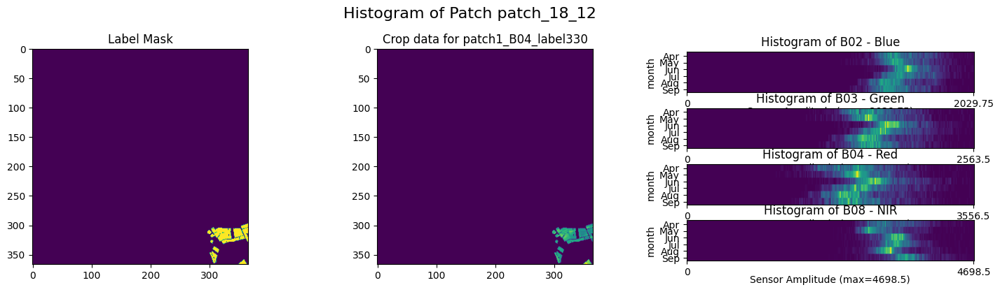

In [30]:
label_idx1 = get_label_idx_from_id(patch_data1, 330)
print(label_idx1)
name1 = get_label_name_from_idx(patch_data1, label_idx1)
print(name1)
label_mask1 = get_label_mask_from_idx(patch_data1, label_idx1)

patch1_B04_label330 = np.array(patch_data1['B04']['monthly'].copy())
patch1_B04_label330[:,label_mask1 == 0] = 0
print(patch1_B04_label330.shape, patch1_B04_label330.dtype)

for n, band in enumerate(['B02', 'B03', 'B04', 'B08']):
    masked_band = np.array(patch_data1[band]['monthly'].copy())
    masked_band[:,label_mask1 == 0] = 0

fig = plt.figure(figsize=(18, 4))
fig.suptitle(f'Histogram of Patch {patch_data["name"]}', fontsize=16, y=1.03)
gs = gridspec.GridSpec(4,3)

ax0 = fig.add_subplot(gs[:,0])
ax0.imshow(label_mask1)
ax0.set_title('Label Mask')

ax1 = fig.add_subplot(gs[:,1])
ax1.imshow(patch1_B04_label330[0])
ax1.set_title('Crop data for patch1_B04_label330')

for n, band in enumerate(['B02', 'B03', 'B04', 'B08']):
    masked_band = np.array(patch_data1[band]['monthly'].copy())
    masked_band[:,label_mask1 == 0] = 0
    ax20 = fig.add_subplot(gs[n,2])
    _ = plot_masked_band_hist(ax20, masked_band)
    _ = ax20.set_title(f'Histogram of {patch_data1[band]["title"]}')
    _ = ax20.set_ylabel('month')

plt.show()

In [31]:
rec = pdat2[(pdat2['patch_name'] == 'patch_17_12') & (pdat1['label'] == 330) & (pdat1['band'] == 'B03')]
masked_band = np.array(rec['masked_band'])[0]
masked_band.shape

(6, 366, 366)

### Plot the histograms using the new Pandas-based method

plot_crop_band_hist_pd(patch_17_11)
(366, 366) <class 'numpy.ndarray'>
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2029
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2563
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 3556
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 4698


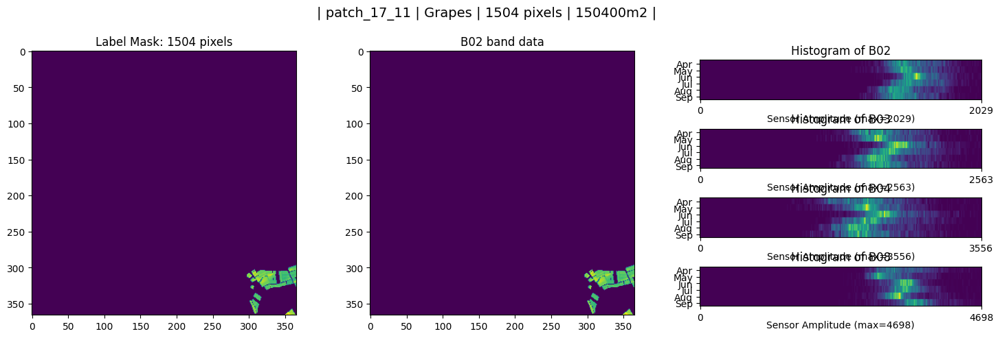

plot_crop_band_hist_pd(patch_17_12)
(366, 366) <class 'numpy.ndarray'>
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2100
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2587
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 3608
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 4718


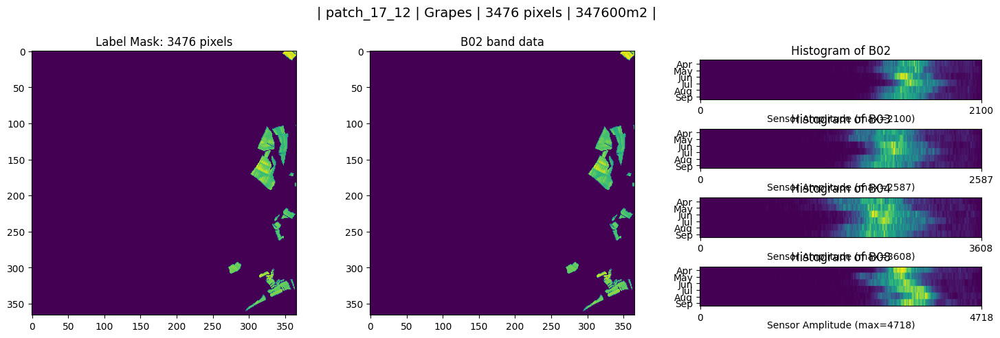

In [32]:
def plot_crop_band_hist_pd(patch, patch_df, label):

    print(f'plot_crop_band_hist_pd({patch.patch_name})')
    patch_name = patch.patch_name
    rec = patch_df[(patch_df['label'] == label) & (patch_df['patch_name'] == patch_name)]
    assert len(rec) == 4, f"Expected one matching record, got {len(rec)}"

    label_mask = patch_df[patch_df['patch_name'] == patch.patch_name]['masked_band'].values[0][0]
    print(label_mask.shape, type(label_mask))

    _name = rec["label_name"].values[0]
    _num_pix = rec["label_count"].values[0]
    _m2 = _num_pix * 100

    fig = plt.figure(figsize=(18, 5))
    fig.suptitle(f'| {patch_name} | {_name} | {_num_pix} pixels | {_m2}m2 |', fontsize=14, y=1.01)
    gs = gridspec.GridSpec(4,3)
    
    ax0 = fig.add_subplot(gs[:,0])
    ax0.imshow(label_mask)
    ax0.set_title(f'Label Mask: {label_mask[label_mask != 0].size} pixels')
    
    ax1 = fig.add_subplot(gs[:,1])
    ax1.imshow(np.array(rec['masked_band'].values[0])[1])
    ax1.set_title(f'{rec["band"].values[0]} band data')

    max = 0
    for n, band in enumerate(['B02', 'B03', 'B04', 'B08']):
        dat = rec.loc[rec.band == band]
        ax20 = fig.add_subplot(gs[n,2])
        _ = plot_masked_band_hist(ax20, dat['masked_band'].values[0])
        _ = ax20.set_title(f'Histogram of {dat["band"].values[0]}')
        max = np.max([max, np.max(dat["masked_band"].values[0])])
    ax20.set_xticks([0, 255])
    plt.show()

plot_crop_band_hist_pd(patch=patch1, patch_df=pdat1, label=330)
plot_crop_band_hist_pd(patch=patch2, patch_df=pdat2, label=330)

### Combine the 2 datasets and produce a combined set of graphs

In [33]:
pdat1.head(5)

,label,band,patch_name,label_index,label_name,masked_band,label_count
0,330,B02,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
1,330,B03,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
2,330,B04,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
3,330,B08,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
4,361,B02,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96


In [34]:
df12 = pd.concat([pdat1, pdat2])
df12

,label,band,patch_name,label_index,label_name,masked_band,label_count
0,330,B02,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
1,330,B03,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
2,330,B04,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
3,330,B08,patch_17_11,0,Grapes,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",1504
4,361,B02,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
5,361,B03,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
6,361,B04,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
7,361,B08,patch_17_11,1,Almonds,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",96
8,442,B02,patch_17_11,2,Olives,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",67
9,442,B03,patch_17_11,2,Olives,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",67


plot_crop_band_hist_pd(patch_17_11)
(366, 366) <class 'numpy.ndarray'>
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2029
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2563
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 3556
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 4698


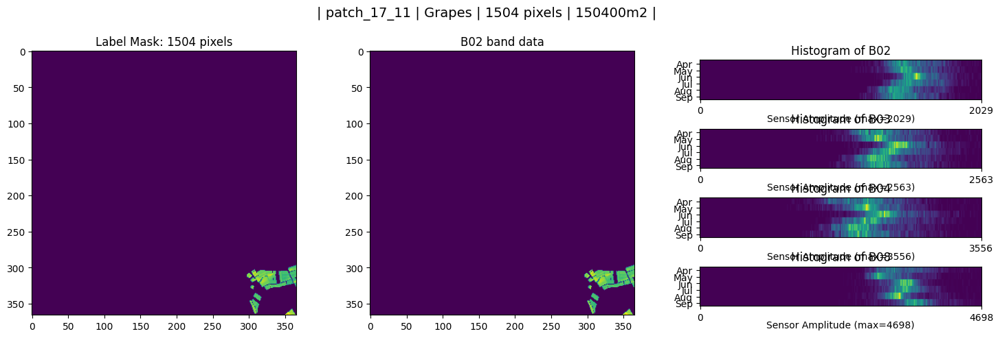

plot_crop_band_hist_pd(patch_17_12)
(366, 366) <class 'numpy.ndarray'>
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2100
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2587
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 3608
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 4718


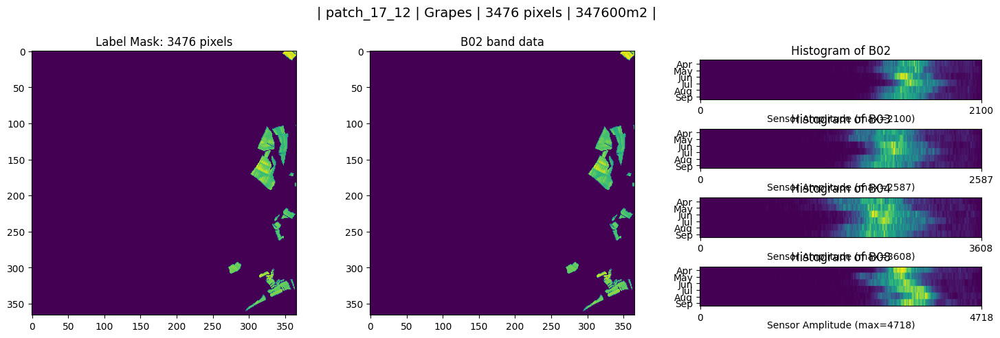

In [35]:
plot_crop_band_hist_pd(patch=patch1, patch_df=df12, label=330)
plot_crop_band_hist_pd(patch=patch2, patch_df=df12, label=330)

In [36]:
dfq = df12[['label', 'band', 'label_count', 'masked_band']]
print(len(dfq))
dfq.head()


48


,label,band,label_count,masked_band
0,330,B02,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
1,330,B03,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
2,330,B04,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
3,330,B08,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
4,361,B02,96,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."


In [37]:
print(dfq['masked_band'][0].shape)
print(np.array(dfq['masked_band'].head())[0].shape)
print(np.array(dfq['masked_band'].head())[1].shape)
print(dfq[['label', 'band']].head(5))
print(dfq[['masked_band']][-10:-1].head(5))
print(dfq[['masked_band']].values.shape)
print(dfq[['masked_band']].values[0].shape)
print(dfq[['masked_band']].values[-1].shape)
print(dfq[['masked_band']].values[0][0].shape)
print(dfq[['masked_band']].values[0][-1].shape)
print(dfq['masked_band'].values[0][0][-5:,-5:])
print(dfq['masked_band'].values[1][0][-5:,-5:])

(2,)
(6, 366, 366)
(6, 366, 366)
   label band
0    330  B02
1    330  B03
2    330  B04
3    330  B08
4    361  B02
                                          masked_band
22  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
23  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
24  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
25  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
26  [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
(48, 1)
(1,)
(1,)
(6, 366, 366)
(6, 366, 366)
[[   0    0    0    0    0]
 [1546    0    0    0    0]
 [1567 1554    0    0    0]
 [1586 1583    0    0    0]
 [1584 1584 1560    0    0]]
[[   0    0    0    0    0]
 [1777    0    0    0    0]
 [1840 1835    0    0    0]
 [1875 1895    0    0    0]
 [1863 1886 1815    0    0]]


In [38]:
#dfq.groupby(by=['label', 'band']).agg({'label_count': np.sum, 'masked_band': np.sum})
#dfq.groupby(by=['label', 'band']).agg({'label_count': 'sum', 'masked_band': 'concat'})
dfq.groupby(by=['label', 'band']).agg({'label_count': 'sum', 'masked_band': 'sum'}, axis=1)
#dfq = dfq.groupby(by=['label', 'band']).sum()
dfq.head()

,label,band,label_count,masked_band
0,330,B02,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
1,330,B03,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
2,330,B04,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
3,330,B08,1504,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
4,361,B02,96,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."


# First working version to concatenate the masks vertically

The result is a series; it should be a column in our previous dataframe

The method is deprecated, suggesting a replacement of .transform(lambda ...), however, this method yields an Value Error exception

    ValueError: Per-column arrays must each be 1-dimensional

In [39]:
#dfmconcat6 = df12[['label', 'band', 'masked_band']].groupby(by=['label', 'band']).pipe(lambda x: np.concatenate(np.array(x))
def concatenate_arrays(x):
    #print(f'concatenate_arrays {type(x)}, count={x.count()}')
    #print(f'concatenate_arrays {type(x)}, {np.array(x.masked_band).shape}')
    #npa = np.concatenate([np.array(y) for y in x])
    
    val = x.masked_band.values
    #print(val.shape)
    #print(val[0].shape)
    npc = np.concatenate([v for v in val], axis=1)
    #print(npc.shape)

    #print(type(val[0,0]))
    #print(type(val), val.dtype)
    #print('dtype:', x.values.dtype)
    #return np.random.randint(1,10) * x
    return npc
    
dfmconcat6 = df12[['label', 'band', 'masked_band']].groupby(by=['label', 'band']).apply(lambda x: concatenate_arrays(x))
print(dfmconcat6.iloc[0].shape)
print(dfmconcat6.iloc[4].shape)
print(dfmconcat6.iloc[8].shape)

(6, 732, 366)
(6, 366, 366)
(6, 732, 366)


/var/folders/g2/dzp3slfd60gf5l4t1gc94hxm0000gp/T/ipykernel_20394/3196986262.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dfmconcat6 = df12[['label', 'band', 'masked_band']].groupby(by=['label', 'band']).apply(lambda x: concatenate_arrays(x))


In [40]:
dfmconcat6.loc[[(330, "B02")]]

label  band
330    B02     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
dtype: object

In [41]:
print(type(dfmconcat6.loc[[(330, "B02")]]))

<class 'pandas.core.series.Series'>


In [42]:
dfmconcat6.loc[[(330, "B02")]].to_numpy()[0].shape

(6, 732, 366)

# This is working.  Plot the histogram!

plot_masked_band_hist: shape=(6, 732, 366), type=int32, band_max: 2587
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2563
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2587


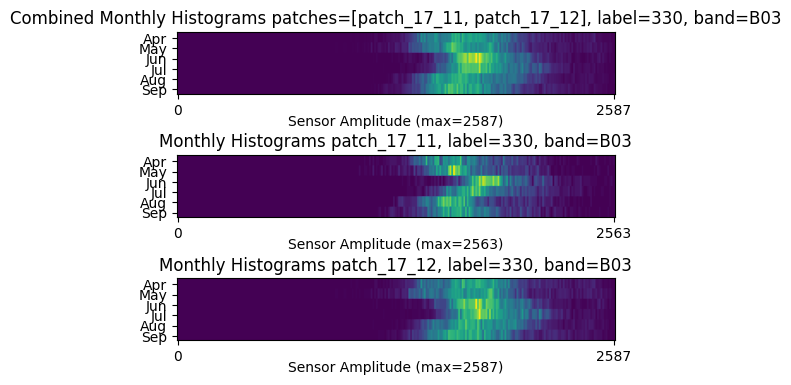

In [43]:
def compare_combined_histograms(patch1, patch2, label, band): 
    
    dat_combined = dfmconcat6.loc[[(label, band)]].to_numpy()[0]
    
    rec1 = df12[(df12['label'] == label) & (df12['patch_name'] == patch1.patch_name) & (df12['band'] == band)]
    assert len(rec1) == 1, f"Expected one matching record, got {len(rec1)}"
    dat1 = rec1['masked_band'].values[0]

    rec2 = df12[(df12['label'] == label) & (df12['patch_name'] == patch2.patch_name) & (df12['band'] == band)]
    assert len(rec2) == 1, f"Expected one matching record, got {len(rec2)}"
    dat2 = rec2['masked_band'].values[0]

    fig, ax = plt.subplots(nrows=3, figsize=(18, 4))
    
    _ = plot_masked_band_hist(ax[0], dat_combined)
    _ = ax[0].set_title(
        f'Combined Monthly Histograms patches=[{patch1.patch_name}, {patch2.patch_name}], label={label}, band={band}'
    )
    _ = ax[0].set_xticks([0, 255])
    
    _ = plot_masked_band_hist(ax[1], dat1)
    _ = ax[1].set_title(f'Monthly Histograms {patch1.patch_name}, label={label}, band={band}')
    _ = ax[1].set_xticks([0, 255])

    _ = plot_masked_band_hist(ax[2], dat2)
    _ = ax[2].set_title(f'Monthly Histograms {patch2.patch_name}, label={label}, band={band}')
    _ = ax[2].set_xticks([0, 255])
    
    plt.subplots_adjust(hspace=1)
    plt.show()

compare_combined_histograms(patch1=patch1, patch2=patch2, label=330, band='B03')

(6, 732, 366) int32
plot_masked_band_hist: shape=(6, 732, 366), type=int32, band_max: 2587
<class 'pandas.core.frame.DataFrame'>
Index(['label', 'band', 'patch_name', 'label_index', 'label_name',
       'masked_band', 'label_count'],
      dtype='object')
(6, 366, 366)
(6, 366, 366) int32
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2563
<class 'pandas.core.frame.DataFrame'>
Index(['label', 'band', 'patch_name', 'label_index', 'label_name',
       'masked_band', 'label_count'],
      dtype='object')
(6, 366, 366)
(6, 366, 366) int32
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2587


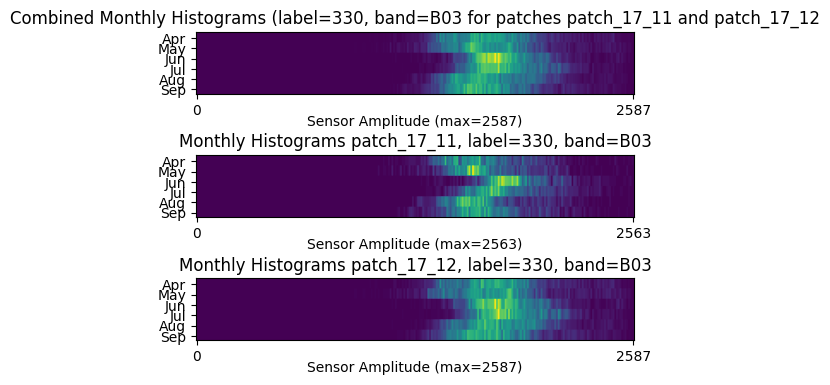

In [44]:
label = 330
band = "B03"

label_330_B02 = dfmconcat6.loc[[(label, band)]].to_numpy()[0]

fig, ax = plt.subplots(nrows=3, figsize=(18, 4))

#patch1_B04_label330 = np.array(patch_data['B04']['monthly'].copy())
#label_mask = get_label_mask_from_idx(patch_data, label_idx)
#patch1_B04_label330[:,label_mask == 0] = 0
print(label_330_B02.shape, label_330_B02.dtype)

_ = plot_masked_band_hist(ax[0], label_330_B02)
_ = ax[0].set_title(f'Combined Monthly Histograms (label={label}, band={band} for patches {patch1.patch_name} and {patch2.patch_name}')
_ = ax[0].set_xticks([0, 255])

rec = df12[(df12['label'] == label) & (df12['patch_name'] == patch1.patch_name) & (df12['band'] == band)]
assert len(rec) == 1, f"Expected one matching record, got {len(rec)}"

print(type(rec))
print(rec.columns)
dat = rec['masked_band'].values[0]
print(dat.shape)

print(dat.shape, dat.dtype)
_ = plot_masked_band_hist(ax[1], dat)
_ = ax[1].set_title(f'Monthly Histograms {patch1.patch_name}, label={label}, band={band}')
_ = ax[1].set_xticks([0, 255])


rec = df12[(df12['label'] == label) & (df12['patch_name'] == patch2.patch_name) & (df12['band'] == band)]
assert len(rec) == 1, f"Expected one matching record, got {len(rec)}"

print(type(rec))
print(rec.columns)
dat = rec['masked_band'].values[0]
print(dat.shape)

print(dat.shape, dat.dtype)
_ = plot_masked_band_hist(ax[2], dat)
_ = ax[2].set_title(f'Monthly Histograms {patch2.patch_name}, label={label}, band={band}')
_ = ax[2].set_xticks([0, 255])

plt.subplots_adjust(hspace=1)
    
plt.show()

plot_crop_band_hist_pd(patch_17_11)
<class 'pandas.core.frame.DataFrame'>
Index(['label', 'band', 'patch_name', 'label_index', 'label_name',
       'masked_band', 'label_count'],
      dtype='object')
(6, 366, 366)
(6, 366, 366) int32
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2563


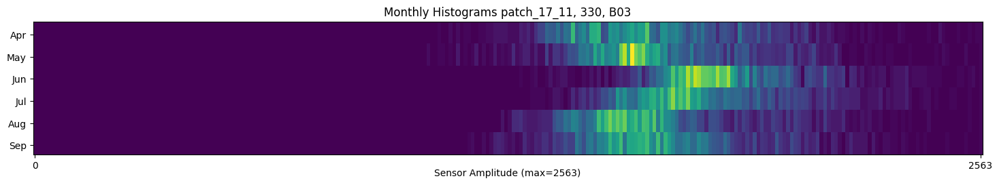

plot_crop_band_hist_pd(patch_17_12)
<class 'pandas.core.frame.DataFrame'>
Index(['label', 'band', 'patch_name', 'label_index', 'label_name',
       'masked_band', 'label_count'],
      dtype='object')
(6, 366, 366)
(6, 366, 366) int32
plot_masked_band_hist: shape=(6, 366, 366), type=int32, band_max: 2587


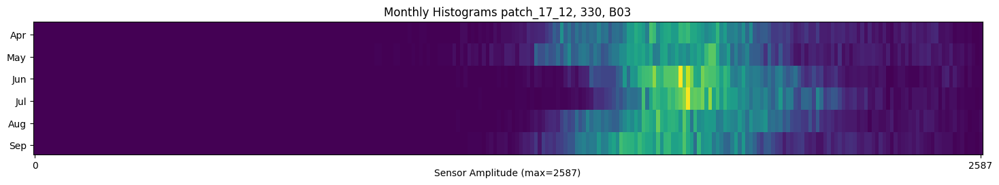

In [45]:
def plot_crop_single_band_hist_pd(patch, patch_df, label, band):

    print(f'plot_crop_band_hist_pd({patch.patch_name})')
    patch_name = patch.patch_name
    rec = patch_df[(patch_df['label'] == label) & (patch_df['patch_name'] == patch_name) & (patch_df['band'] == band)]
    assert len(rec) == 1, f"Expected one matching record, got {len(rec)}"

    print(type(rec))
    print(rec.columns)
    dat = rec['masked_band'].values[0]
    print(dat.shape)
    
    _name = rec["label_name"].values[0]
    _num_pix = rec["label_count"].values[0]
    _m2 = _num_pix * 100


    fig, ax = plt.subplots(figsize=(18, 4))
    print(dat.shape, dat.dtype)
    
    _ = plot_masked_band_hist(ax, dat)
    _ = ax.set_title(f'Monthly Histograms {patch_name}, {label}, {band}')
    _ = ax.set_xticks([0, 255])
    plt.show()

plot_crop_single_band_hist_pd(patch=patch1, patch_df=pdat1, label=330, band='B03')
plot_crop_single_band_hist_pd(patch=patch2, patch_df=pdat2, label=330, band='B03')

# Verify the pixel counts by summing the counts of the individual, pre-concatenated frames

In [46]:
#dfmconcat6.index[(330,'B02')]
#df.loc[[(330, "B02"), (330, "B03")]]
dfmconcat6.loc[[(330, "B02"), (330, "B03")]]

label  band
330    B02     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
       B03     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
dtype: object

In [47]:
dfmconcat6[[330]]

label  band
330    B02     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
       B03     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
       B04     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
       B08     [[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...
dtype: object

In [53]:
def concatenate_arrays(x):
    print(f'concatenate_arrays {type(x)}, count={x.count()}')
    #print(f'concatenate_arrays {type(x)}, {np.array(x.masked_band).shape}')
    #npa = np.concatenate([np.array(y) for y in x])
    
    val = x.values
    print(val.shape)
    print(val[0].shape)
    npc = np.concatenate([v for v in val], axis=1)
    #print(npc.shape)

    #print(type(val[0,0]))
    #print(type(val), val.dtype)
    #print('dtype:', x.values.dtype)
    #return np.random.randint(1,10) * x
    return npc
    
dfmconcat7 = df12[['label', 'band', 'masked_band']].groupby(by=['label', 'band']).transform(lambda x: concatenate_arrays(x))
print(dfmconcat7.iloc[0].shape)
print(dfmconcat7.iloc[4].shape)
print(dfmconcat7.iloc[8].shape)

concatenate_arrays <class 'pandas.core.series.Series'>, count=2
(2,)
(6, 366, 366)


ValueError: transform must return a scalar value for each group

In [ ]:
df12['dfmconcat7'] = df12[['label', 'band', 'masked_band']].groupby(by=['label', 'band']).apply(lambda x: concatenate_arrays(x))
df12.columns

In [ ]:
#df2 = df12.append(dfmconcat6)
print(type(df12))
print(type(dfmconcat6))
#df12['grouped_masked_bands'] = dfmconcat6
#df2 = pd.concat([df12, dfmconcat6], axis=0)
df2 = pd.concat((df12, dfmconcat6.rename('grouped_masked_bands')), axis=1)
#df2 = pd.concat((df12, dfmconcat6), axis=1, reindex=False)
df2.head()
#df2 = df12.append(dfmconcat6)
#df2.head()

In [ ]:
dfmconcat6

In [ ]:
print(dfmconcat6.iloc[0].shape)

fig, ax = plt.subplots(figsize=(18, 4))

patch1_B04_label330 = np.array(patch_data['B04']['monthly'].copy())
label_mask = get_label_mask_from_idx(patch_data, label_idx)
patch1_B04_label330[:,label_mask == 0] = 0
print(patch1_B04_label330.shape, patch1_B04_label330.dtype)

_ = plot_masked_band_hist(ax, patch1_B04_label330)
_ = ax.set_title(f'Monthly Histograms for band patch1_B04_label330')
_ = ax.set_xticks([0, 255])

In [ ]:
type(dfmconcat6)

In [ ]:
concatenate_piped_3d_array_groups = lambda x: type(x)

#dfmconcat5 = concatenate_piped_3d_array_groups(grouped.head(2))
dfmconcat5 = grouped.pipe(concatenate_piped_3d_array_groups)
dfmconcat5

In [ ]:
def concatenate_3d_arrays(grouped_array):
    print(type(grouped_array))
    return 42

dfmconcat4 = grouped.head(2).agg({'masked_band': lambda x: concatenate_3d_arrays(x)})
dfmconcat4.groupby('A').pipe(lambda x: x.max() - x.min())
dfmconcat4.head()

### pd.concat produces a string output, which is a concatenated list of 3d (or 4d?) arrays

In [ ]:
dfmconcat = grouped.agg({'masked_band': lambda x: pd.concat([x], ignore_index=True, axis=1)}).head(20)
dfmconcat

In [ ]:
dfmconcat2 = grouped.agg({'masked_band': lambda x: np.concatenate([x.to_numpy()], axis=0)}).head(50)
dfmconcat2

In [ ]:
print(type(dfmconcat2))
print(dfmconcat2.columns)

In [ ]:
for n,dfm2 in enumerate(dfmconcat2['masked_band']):
    #print(dfm2.shape)
    for d in dfm2:
        d2 = np.expand_dims(d, axis=0)
        #print(d.shape)
        #print(n, d2.shape)
    d3 = np.concatenate([np.expand_dims(d3, axis=0) for d3 in dfm2])
    print(n, d3.shape)

In [ ]:
dfmconcat2.dtypes

In [ ]:
print(dfmconcat2['masked_band'].values[0].shape)
print(dfmconcat['masked_band'].values[0][0].shape)

In [ ]:
print(dfmconcat['masked_band'].values[0].shape)
print(dfmconcat['masked_band'].values[0][0].shape)
print(pd.concat([dfmconcat['masked_band']]).shape)

In [ ]:
for v in dfmconcat['masked_band'].to_numpy():
    for v2 in v:
        print(f'{v.shape}: {v[0].shape}:{v[1].shape}: shape: {v2.shape}')
    #print(np.array([v2 for v2 in v]).shape)

In [ ]:
np.array([v2 for v2 in dfmconcat['masked_band'].to_numpy()]).shape

## Did this just work?

In [ ]:
dfmconcat3 = grouped.agg({'masked_band': lambda x: np.concatenate(x.to_numpy(), axis=1)})
dfmconcat3